In [1]:
import math 
import os
from pathlib import Path
import heapq
from collections import *
import time

import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

In [2]:
BASE_PATH = Path('/Users/vinay/ub/spring-22/CSE573-CVIP/BackgroundStitching/images/pano')

In [3]:
sift = cv2.SIFT_create()


def homography(match_pts, cv=True):
    src_pts, dst_pts = match_pts
    k = cv2.RANSAC if cv is True else 0
    if len(src_pts) > 4:
        h, mask = cv2.findHomography(src_pts, dst_pts, k, 5)
    else:
        h, mask = np.array([[0, 0, 0], [0, 0, 0], [0, 0, 0]]), None
    
    return h, mask

def apply_homography(args, img1, img2, H, mask=None):
    img1 = img1.copy()
    img2 = img2.copy()
    
    h, w, _ = shape(img1)
    (matches, (kp1, kp2)) = args
    
    pts = np.float32([ [0, 0],[0, h-1],[w-1, h-1],[w-1, 0] ]).reshape(-1, 1, 2)
    dst = cv2.perspectiveTransform(pts, H)
    img2 = cv2.polylines(img2, [np.int32(dst)], True, 255, 3, cv2.LINE_AA)
    
    draw_params = dict(
        matchColor = (0,255,0), # draw matches in green color
        singlePointColor = None,
        matchesMask = mask, # draw only inliers
        flags = 2,
    )
    img = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, **draw_params)
    
    return img
        
    
def transform_c(coordinates, homography):
    x, y, w, h = coordinates
    src = np.float32([[x, y], [x, y + h - 1], [x + w - 1, y], [x + w - 1, y + h - 1]]).reshape(-1, 1, 2)
    
    dst = cv2.perspectiveTransform(src, homography)
    l, _, _ = dst.shape
    dst = dst.reshape((l, 2))
    
    min_x, max_x = np.min(dst[:, 0]), np.max(dst[:, 0])
    min_y, max_y = np.min(dst[:, 1]), np.max(dst[:, 1])
    
    new_x = int(np.floor(min_x))
    new_y = int(np.floor(min_y))
    new_w = int(np.ceil(max_x - min_x))
    new_h = int(np.ceil(max_y - min_y))
    
    return new_x, new_y, new_w, new_h

def shape(img):
    s = img.shape
    a = 0
    if len(s) == 3:
        h, w, a = img.shape
    else:
        h, w = img.shape
        
    return h, w, a

def get_new_c(c, homography):
    return np.floor(cv2.perspectiveTransform(np.float32(c).reshape(-1, 1, 2), homography))

def img2c(img):
    size = img.shape
    return (0, 0, size[1], size[0])

def translate_homography(dx, dy, H):
    dx, dy = abs(dx) if dx < 0 else 0, abs(dy) if dy < 0 else 0
    transform = np.float32(
        [
            [1, 0, dx],
            [0, 1, dy],
            [0, 0,  1],
        ]
    )
    new_h = transform.dot(H)
    return new_h, (dx, dy)

def resize(img, factor):
    h, w, a = shape(img)
    op = cv2.resize(img, (int(w*factor), int(h*factor)))
    return op

def show(img, dpi=100, disable_axis=True, color=True):
    if color:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
    plt.figure(dpi=dpi)
    plt.imshow(img, cmap='gray')
    
    if disable_axis:
        ax = plt.gca()
        ax.axes.xaxis.set_visible(False)
        ax.axes.yaxis.set_visible(False)
        
def warp(img1, img2, H):
    _, _, a = shape(img1)
    dx, dy, _, _ = transform_c(img2c(img1), H)
    new_H, (tx, ty) = translate_homography(dx, dy, H)
    x, y, w, h = transform_c(img2c(img1), new_H)
    width, height = max(tx + img2.shape[1], x+w), max(ty + img2.shape[0], y+h)
    print(f'tx:{tx}, ty:{ty}, img2:{img2.shape}, x:{x}, y:{y}, w:{w}, h:{h}')

    warped_img1 = cv2.warpPerspective(img1, new_H, (width, height))
    result = warped_img1.copy()
    result[ty:ty+img2.shape[0], tx:tx+img2.shape[1]] = img2
    if a:
        warped_img2 = np.zeros((height, width, a), dtype=np.uint8)
        warped_img2[ty:ty+img2.shape[0], tx:tx+img2.shape[1], :] = img2
    else:
        warped_img2 = np.zeros((height, width), dtype=np.uint8)
        warped_img2[ty:ty+img2.shape[0], tx:tx+img2.shape[1]] = img2
    
    return warped_img1, warped_img2, result

def border(img, n):
    img = cv2.copyMakeBorder(img, b, b, b, b, cv2.BORDER_CONSTANT)
    return img

def extract_features(image, extractor):
    keypoints, desc = extractor.detectAndCompute(image, None)
    return keypoints, desc

def matcher(s_desc, t_desc, measure, thresh=0.8, reverse=False):
    arr = []

    for s_idx, s_d in enumerate(s_desc):
        temp = []
        for t_idx, t_d in enumerate(t_desc):
            score = measure(s_d, t_d)
            temp.append(score)
        
        if len(temp) > 0:
            min_1, min_2 = sorted(temp)[:2]

            if min_1 != min_2:
                if (min_1 / min_2) < thresh:
                    arr.append(round(min_1, 2))

    return arr, sum(arr)/len(arr)

def matcher_v(s_desc, t_desc, measure, thresh=0.8):
    arr = []
    pair_dist = pairwise(s_desc, t_desc)
    min_pairs = np.partition(pair_dist, 1)[:, :2]
    mins = min_pairs[min_pairs[:, 0] / min_pairs[:, 1] < thresh][:, 0]
    return mins, mins.mean()

def extract_all_features(imgs):
    sift = cv2.SIFT_create()
    feature_desc = np.array(
        list(map(lambda x: extract_features(x, sift), imgs)),
        dtype=object,
    )[:, 1]
    
    return feature_desc

In [4]:
def overlap_region(w_img1, w_img2):
    mask = np.logical_and(
        w_img1,
        w_img2,
    ).astype('int8')
    intersection = np.argwhere(mask == True)

    max_dims = np.max(intersection, axis=0)
    min_dims = np.min(intersection, axis=0)

    y_max, x_max = max_dims[0], max_dims[1]
    y_min, x_min = min_dims[0], min_dims[1]
    
    return mask, (x_max, y_max, x_min, y_min)

def apply_mask(mask, img1, img2, p=0.60):
    mask1 = mask.copy()
    mask2 = mask.copy()
    
    mask1[mask == 0] = p
    mask1[mask == 1] = 0
    
    mask2[mask == 1] = 1-p
    mask2[mask == 0] = 0
    
    img1[img1 == 0] = img2[img1 == 0]
    img2[img2 == 0] = img1[img2 == 0]
    
    img = (img1 * mask1) + (img2 * mask2)

    return img

def select(img1, img2, mask, thresh=5):
    h, w, a = shape(img1)
    if a:
        img_mask = np.ones((h, w, a))
    else:
        img_mask = np.ones((h, w))
        
    l = []
    
    # ignore empty image space
    for p in range(w):
        n1 = (img1[:, p] == 0.0).sum()
        n2 = (img2[:, p] == 0.0).sum()
        
        if n1 > 0 or n2 > 0:
            break
    
    
    for i in range(p, w):
        n1 = (img1[:, i] == 0).sum()
        n2 = (img2[:, i] == 0).sum()
        img1_col = img1[:, i]
        img2_col = img2[:, i]
       
        if i == p:
            if n1 < n2:
                ref_col = img1_col
                last = 1
                flag = False
            else:
                ref_col = img2_col
                last = 2
                flag = True
        else:
            # select pixels in the overlap region and find difference
            d1 = int(((img1_col * mask[:, i] - ref_col * mask[:, i-1])).sum())
            d2 = int(((img2_col * mask[:, i] - ref_col *  mask[:, i-1])).sum())

            if d1 < d2:
                if last == 2:
                    if l and i - l[-1] < thresh:
                        l.pop()
                    else:
                        l.append(i)
                    last = 1
                ref_col = img1_col
            else:
                if last == 1:
                    if l and i - l[-1] < thresh:
                        l.pop()
                    else:
                        l.append(i)
                    last = 2
                ref_col = img2_col
                    
    l.append(i)
    k = 0
    
    for x in l:
        img_mask[:, k:x+1] = flag
        flag = not flag
        k = x
        
    return l, np.logical_not(img_mask)

def merge(img1, img2, x_min, y_min, x_max, y_max, mask, thresh=3, pad=5):
    h, w, a = shape(img1)
    mask_r = np.zeros_like(img1, dtype=bool)
   
    x_min_n = max(x_min-pad, 0)
    y_min_n = max(y_min-pad, 0)
    x_max_n = min(x_max+pad, w)
    y_max_n = min(y_max+pad, h)

    img1 = img1[y_min_n:y_max_n+1, x_min_n:x_max_n+1]
    img2 = img2[y_min_n:y_max_n+1, x_min_n:x_max_n+1]
    mask = mask[y_min_n:y_max_n+1, x_min_n:x_max_n+1]
    
    l, main_mask = select(img1, img2, mask=mask, thresh=thresh)
    k = 0
    temp = []
    
    for x in l[1:]:
        sub_img1 = img1[:, k:x+1]
        sub_img2 = img2[:, k:x+1]
        new_mask = mask[:, k:x+1]
        
        if a:
            sub_img1 = sub_img1.transpose((1, 0, 2))
            sub_img2 = sub_img2.transpose((1, 0, 2))
            new_mask = new_mask.transpose((1, 0, 2))
        else:
            sub_img1 = sub_img1.T
            sub_img2 = sub_img2.T
            new_mask = new_mask.T
        
        _, sub_mask = select(
            sub_img1,
            sub_img2,
            new_mask,
            thresh=thresh,
        )
            
        if a:
            sub_mask = sub_mask.transpose((1, 0, 2))
            sub_img1 = sub_img1.transpose((1, 0, 2))
            sub_img2 = sub_img2.transpose((1, 0, 2))
        else:
            sub_mask = sub_mask.T
            sub_img1 = sub_img1.T
            sub_img2 = sub_img2.T

        main_mask[:, k:x+1] = sub_mask
        k = x
        
    mask_r[y_min_n:y_max_n+1, x_min_n:x_max_n+1] = main_mask
    
    return mask_r[y_min:y_max+1, x_min:x_max+1]

def ransac(match_pts, thresh, factor, p=4, n=10000, prob=0.99):
    src_pts, dst_pts = match_pts
    k = len(src_pts)
    
    min_error = float('inf')
    best_inliers = float('-inf')
    mask = []
    src_pts_f = []
    dest_pts_f = []
    
    for i in range(n):
        rand_idx = np.random.choice(k, p)
        src_pts_s = src_pts[rand_idx]
        dst_pts_s = dst_pts[rand_idx]

        H, _ = cv2.findHomography(src_pts_s.reshape(-1, 1, 2), dst_pts_s.reshape(-1, 1, 2))
        dst_pts_p = cv2.perspectiveTransform(src_pts.reshape(-1, 1, 2), H).reshape(-1, 2)

        errors = np.linalg.norm(dst_pts_p - dst_pts, axis=1)
        errors = errors / factor
        inliers = errors < thresh
        n_inliers = inliers.sum()
        
        if n_inliers > best_inliers:
            min_error = errors.mean()
            print(i, min_error, n_inliers, n_inliers/k)
            best_inliers = n_inliers
            src_pts_f = src_pts[inliers]
            dest_pts_f = dst_pts[inliers]
            mask = inliers
            
        if n_inliers/k > prob:
            # print('break')
            break

    return src_pts_f, dest_pts_f, mask.astype(np.uint8)

def pairwise(X, Y):
    dists = -2 * np.dot(X, Y.T) + np.sum(np.square(Y), axis=1, keepdims=True).T + np.sum(np.square(X), axis=1, keepdims=True)
    return np.sqrt(dists)

def get_matching_points(matches, kp1, kp2):
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ])
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ])
    return src_pts, dst_pts

def show_batch(imgs, size=20, dpi=100):
    n = len(imgs)
    col = 4
    row = (n // col) + 1 
    fig = plt.figure(figsize=(size, size), dpi=dpi)
    grid = ImageGrid(
        fig, 111,
        nrows_ncols=(row, col), 
        axes_pad=0.4, 
     )
    
    for idx, (ax, im) in enumerate(zip(grid, imgs)):
        # Iterating over the grid returns the Axes.
        im= cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        ax.imshow(im, cmap='gray')
        ax.set_title(f'Image {idx}')
        
    plt.show()

def read_batch(path, scale_factor = 1.0):
    imgs = {}
    lis = list(os.walk(path))
    
    if lis:
        p, _, files = lis[0]
        idx = 0
        for file in files:
            if '.DS_Store' not in file:
                imgs[idx] = cv2.imread(f'{p}/{file}')
                if scale_factor != 1.0:
                    imgs[idx] = resize(imgs[idx], scale_factor)
                idx += 1

    return imgs

In [5]:
def match_desc(desc1, desc2, lowes_ratio=0.8):
    pair_dist = pairwise(desc1, desc2)
    min_pairs = np.partition(pair_dist, 1)[:, :2]
    idx = (min_pairs[:, 0] / min_pairs[:, 1]) < lowes_ratio
    n_matches = len(min_pairs[idx])
    matches = []

    for q_idx, t_idx in zip(np.nonzero(idx)[0], np.argmin(pair_dist[idx], 1)):
        matches.append(
            cv2.DMatch(
                _queryIdx=q_idx,
                _trainIdx=t_idx,
                _distance=pair_dist[q_idx, t_idx],
            )
        )
        
    return matches, n_matches

def stitch(img1_c, img2_c, r_thresh=0.015, cv=True):
    sift = cv2.SIFT_create()
    img1 = cv2.cvtColor(img1_c, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img2_c, cv2.COLOR_BGR2GRAY)
    
    h1, w1 = img1.shape
    h2, w2 = img2.shape
    
    kp1, desc1 = extract_features(img1, sift)
    kp2, desc2 = extract_features(img2, sift)
    
    matches, score = match_desc(desc1, desc2, lowes_ratio=0.8)
    src_pts, dst_pts = get_matching_points(matches, kp1, kp2)
    
    if cv is False:
        K = math.sqrt((h1 + h2)**2 + (w1 + w2)**2)
        src_pts, dst_pts, mask = ransac((src_pts, dst_pts), thresh=r_thresh, factor=K)
        
    H, _ = homography((src_pts, dst_pts), cv=cv)
    
    w_img1, w_img2, warped_img = warp(img1_c, img2_c, H)
    
    overlap_mask, (x_max, y_max, x_min, y_min) = overlap_region(w_img1, w_img2)
    main_mask = merge(
        w_img1, 
        w_img2,
        x_min, y_min, x_max, y_max,
        overlap_mask,
        thresh=10,
    )
    result = apply_mask(
        main_mask,
        w_img1[y_min:y_max+1, x_min:x_max+1],
        w_img2[y_min:y_max+1, x_min:x_max+1],
    )

    warped_img[y_min:y_max+1, x_min:x_max+1] = result
    
    return warped_img

def get_all_matches(imgs, feature_desc, thresh=200):
    root = 0
    n = len(imgs)
    all_matches = defaultdict(lambda: np.zeros(n))
    best_n = float('-inf')
    
    for idx, img1 in enumerate(imgs):
        desc1 = feature_desc[idx]
        
        for jdx, img2 in enumerate(imgs):
            if idx == jdx:
                continue
                
            desc2 = feature_desc[jdx]
            matches, n_matches = match_desc(desc1, desc2)                
            all_matches[idx][jdx] = n_matches
            
        temp = all_matches[idx]
        if temp[temp > thresh].shape[0] > best_n:
            best_n = temp[temp > thresh].shape[0]
            best_match = idx
                
    return dict(all_matches), best_match

def get_best_matches(root_img, root, imgs, feature_desc, matches):
    sift = cv2.SIFT_create()
    _, r_desc = extract_features(root_img, sift)
    match_scores = {}
    best_matches = float('-inf')
    best_match = None
    
    for match in matches:
        desc = feature_desc[match]
        _, n_matches = match_desc(r_desc, desc)
        
        match_scores[match] = n_matches
        if n_matches > best_matches:
            best_matches = n_matches
            best_match = match
        
    return match_scores, best_match

def stitch_pano(imgs, fd, thresh=200, cv=True, r_thresh=0.015):
    n = len(imgs)
    possible_matches = set(range(n))
    match_scores, root = get_all_matches(imgs, fd)
    root_img = imgs[root]
    print(f'stitching {root}')
    
    while root is not None:
        show(root_img, dpi=150)
        possible_matches.remove(root)
        match_scores, root = get_best_matches(root_img, root, imgs, fd, possible_matches)
        # print(match_scores, root)
        if root is None or root_img is None or match_scores[root] < thresh:
            break
        print(f'stitching {root}')
        root_img = stitch(imgs[root], root_img, r_thresh=r_thresh, cv=cv)
        possible_matches = set(match_scores.keys())  
        
    return root_img

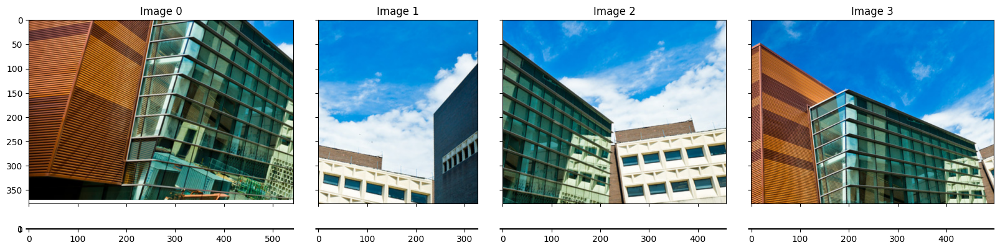

In [6]:
imgs1 = read_batch(BASE_PATH/'1')
fd1 = extract_all_features(imgs1.values())
show_batch(imgs1.values())

In [22]:
ms, root = get_all_matches(imgs1, fd1)
ms, root

({0: array([  0.,  54., 566., 408.]),
  1: array([ 24.,   0., 221.,  45.]),
  2: array([507., 252.,   0., 356.]),
  3: array([365.,  36., 304.,   0.])},
 2)

In [8]:
def get_overlap(imgs, fd, thresh):
    match_score, _ = get_all_matches(imgs, fd)
    x = np.array(list(match_score.values()))
    temp = x == 0
    x[x < thresh] = 0
    x[x > thresh] = 1
    x[temp] = 1
                
    return x

overlap = get_overlap(imgs1, fd1, 200)
overlap

array([[1., 0., 1., 1.],
       [0., 1., 1., 0.],
       [1., 1., 1., 1.],
       [1., 0., 1., 1.]])

In [9]:
def to_graph(overlap):
    graph = defaultdict(list)
    for i in range(len(overlap)):
        graph[i] = np.nonzero(overlap[i])[0]
        
    return dict(graph)

to_graph(overlap)

{0: array([0, 2, 3]),
 1: array([1, 2]),
 2: array([0, 1, 2, 3]),
 3: array([0, 2, 3])}

stitching 2
stitching 0
tx:397, ty:0, img2:(416, 459, 3), x:0, y:68, w:564, h:404
stitching 3
tx:0, ty:203, img2:(472, 856, 3), x:73, y:0, w:663, h:563
stitching 1
tx:0, ty:0, img2:(675, 856, 3), x:567, y:78, w:459, h:541


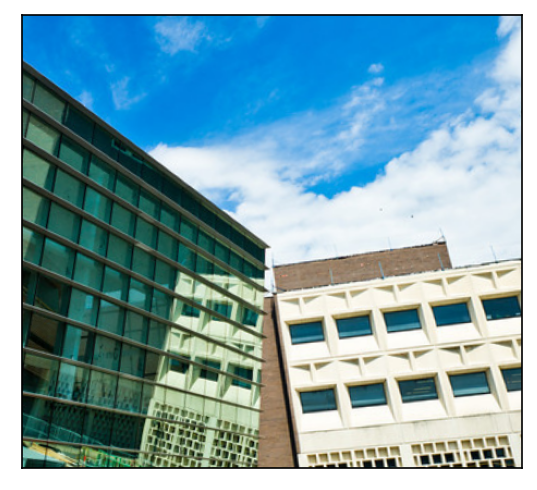

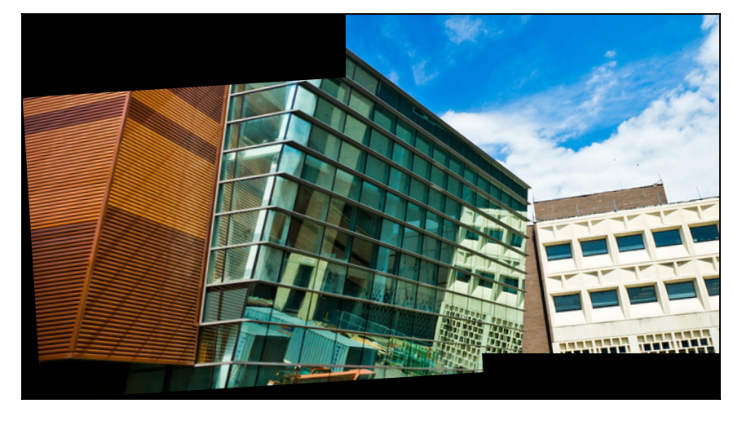

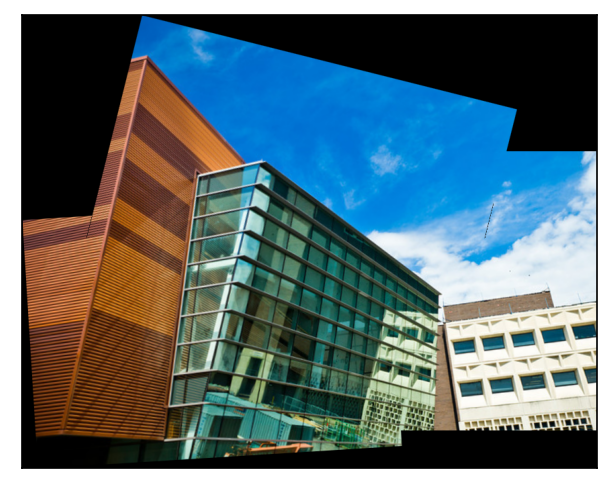

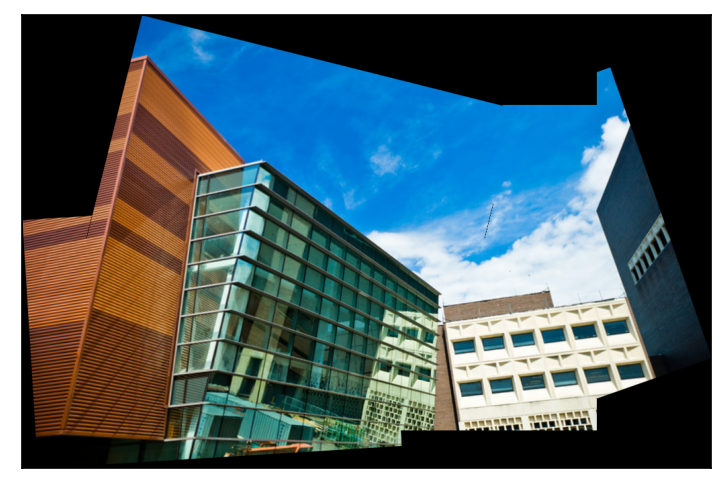

In [10]:
xx = stitch_pano(imgs1, fd1, cv=True)
# show(xx, dpi=150)

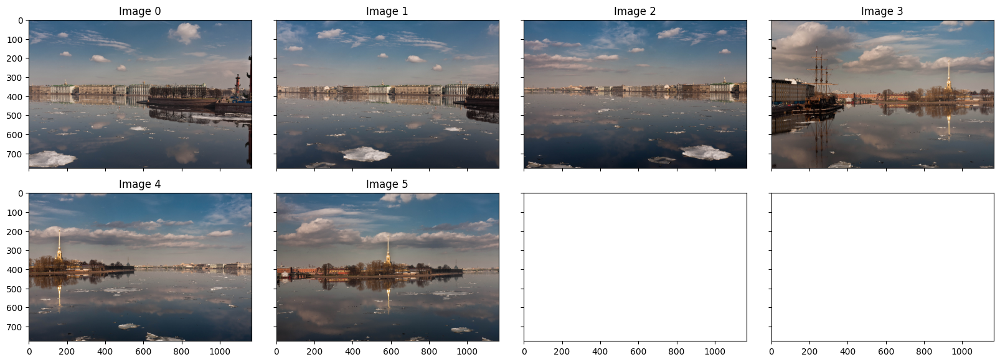

In [11]:
imgs2 = read_batch(BASE_PATH/'2', 0.3)
fd2 = extract_all_features(imgs2.values())
show_batch(imgs2.values())

In [12]:
get_overlap(imgs2, fd2, 200)

array([[1., 1., 1., 0., 0., 0.],
       [1., 1., 1., 0., 0., 0.],
       [1., 1., 1., 0., 1., 0.],
       [0., 0., 0., 1., 1., 1.],
       [0., 0., 1., 1., 1., 1.],
       [0., 0., 0., 1., 1., 1.]])

stitching 2
stitching 1
0 0.021623628 426 0.7620751341681574
2 0.01912648 506 0.9051878354203936
38 0.022718512 507 0.9069767441860465
1987 0.019775538 511 0.9141323792486583
tx:0, ty:86, img2:(777, 1166, 3), x:506, y:0, w:1297, h:904
stitching 0
0 0.018968103 592 0.8010825439783491
1 0.016902903 633 0.8565629228687416
3 0.016889364 681 0.9215155615696887
5 0.01484971 691 0.9350473612990527
129 0.015173647 692 0.9364005412719891
418 0.016812082 693 0.9377537212449256
tx:0, ty:166, img2:(904, 1803, 3), x:861, y:0, w:1768, h:1190
stitching 4
0 10.613312 5 0.01845018450184502
1 0.08345216 94 0.34686346863468637
3 0.054184 222 0.8191881918819188
4 0.0510972 225 0.8302583025830258
5 0.05159614 235 0.8671586715867159
tx:916, ty:0, img2:(1190, 2629, 3), x:0, y:95, w:1499, h:1065
stitching 5
0 0.082326904 262 0.6599496221662469
1 0.016772812 379 0.9546599496221663
tx:1621, ty:272, img2:(1190, 3545, 3), x:0, y:0, w:2724, h:1746
stitching 3
0 0.042894147 250 0.8710801393728222
3 0.058058683 256 

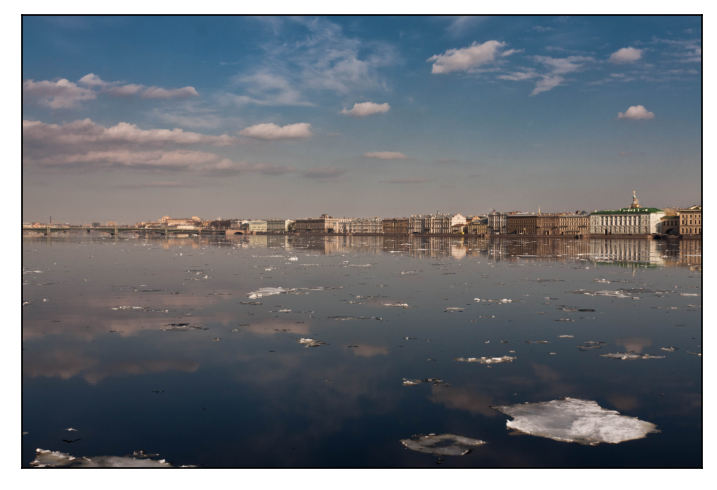

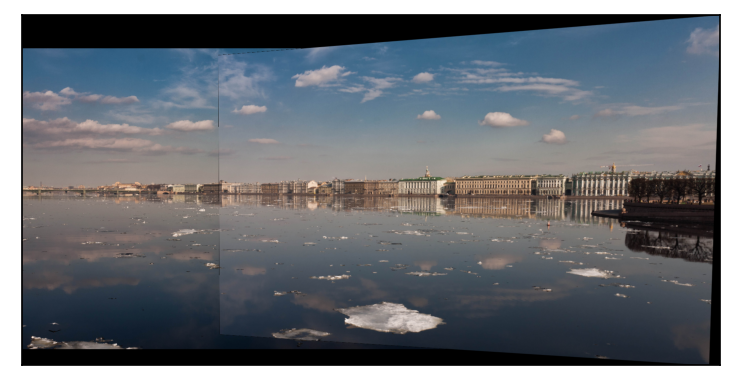

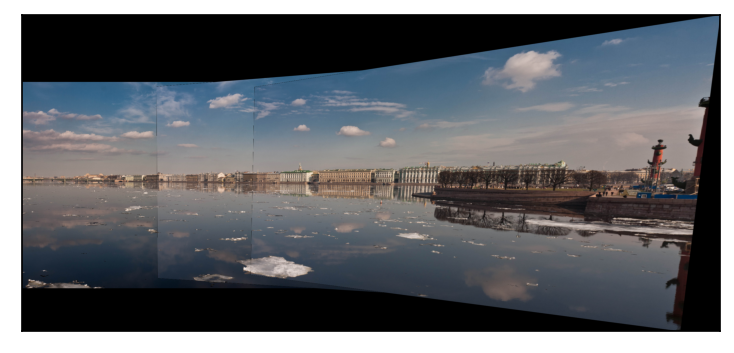

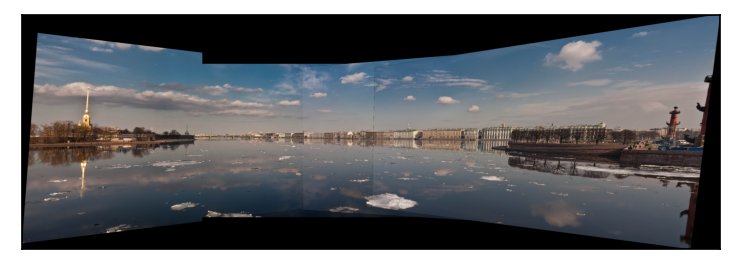

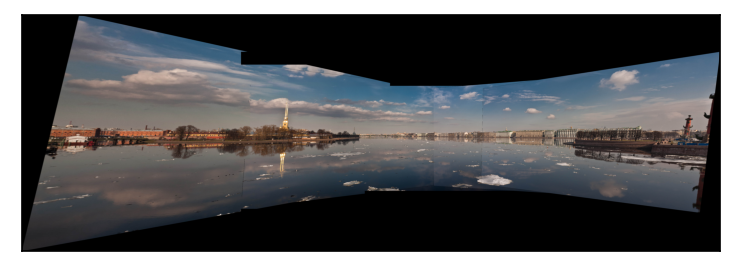

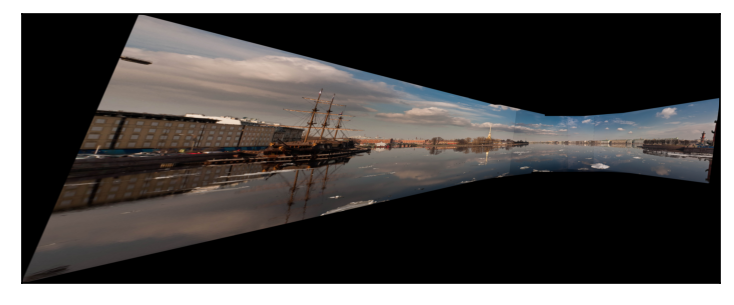

In [13]:
xx = stitch_pano(imgs2, fd2, 200, False)
# show(xx, dpi=150)

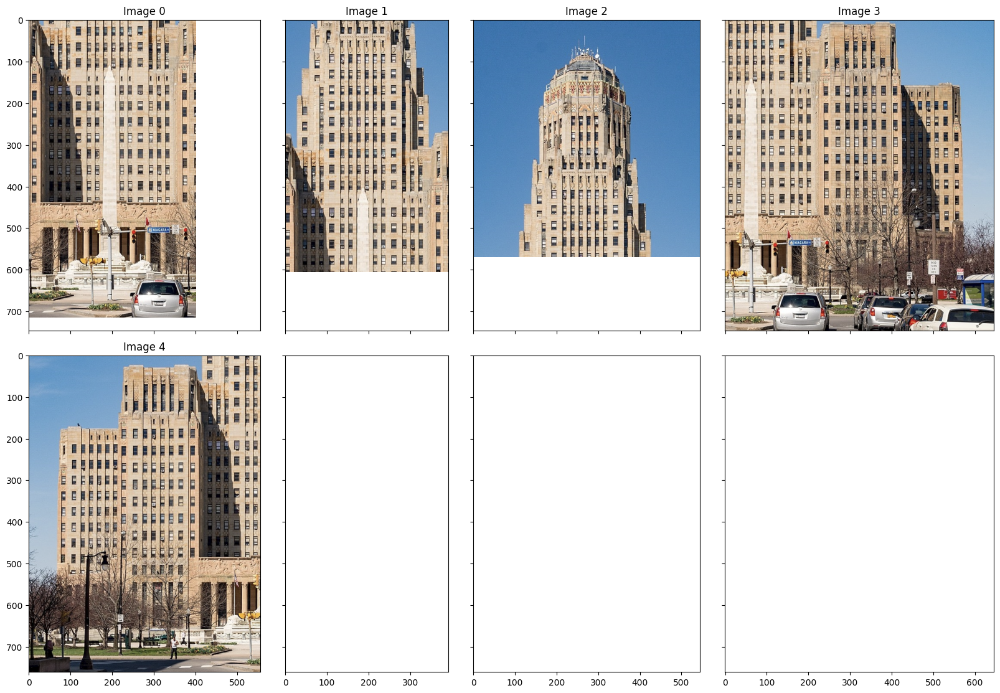

In [14]:
imgs3 = read_batch(BASE_PATH/'3')
fd3 = extract_all_features(imgs3.values())
show_batch(imgs3.values())

In [15]:
get_overlap(imgs3, fd3, 200)

array([[1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [0., 1., 1., 0., 0.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.]])

stitching 0
stitching 3
tx:0, ty:31, img2:(715, 402, 3), x:130, y:0, w:645, h:746
stitching 4
tx:381, ty:17, img2:(746, 775, 3), x:0, y:0, w:556, h:761
stitching 1
tx:0, ty:245, img2:(763, 1156, 3), x:388, y:0, w:392, h:605
stitching 2
tx:0, ty:326, img2:(1008, 1156, 3), x:307, y:0, w:544, h:570


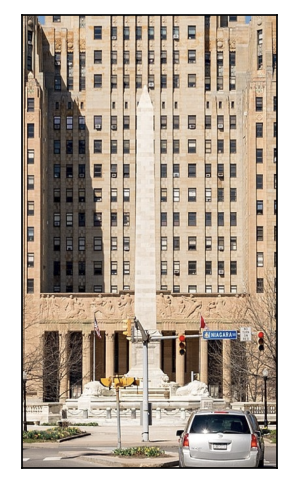

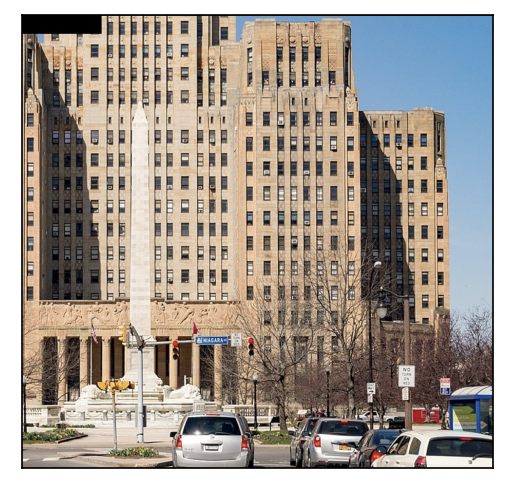

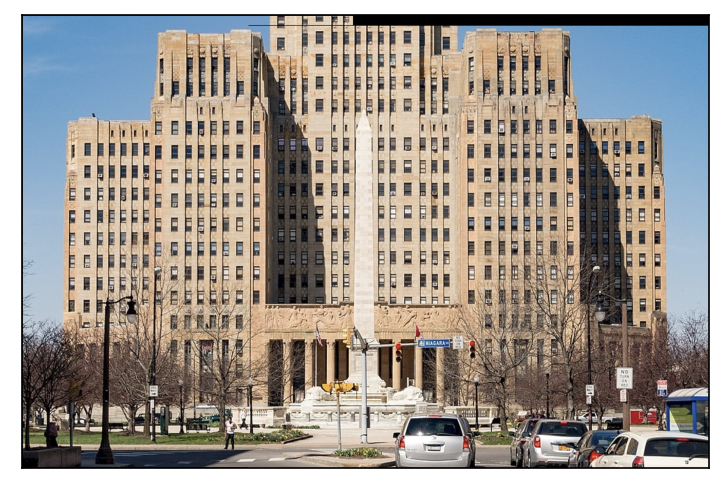

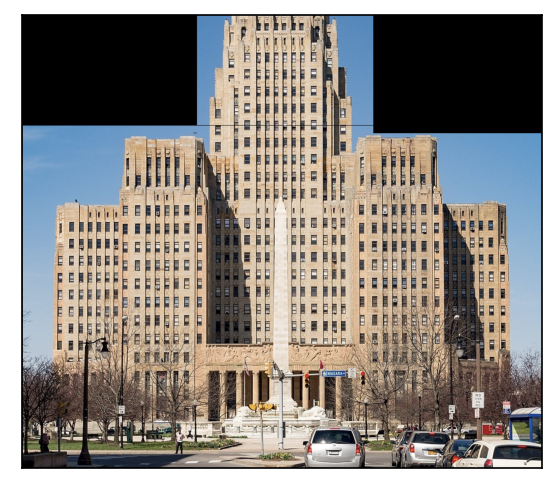

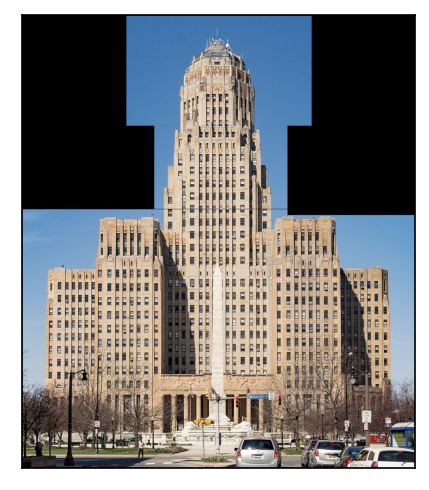

In [16]:
xx = stitch_pano(imgs3, fd3)
# show(xx, dpi=150)

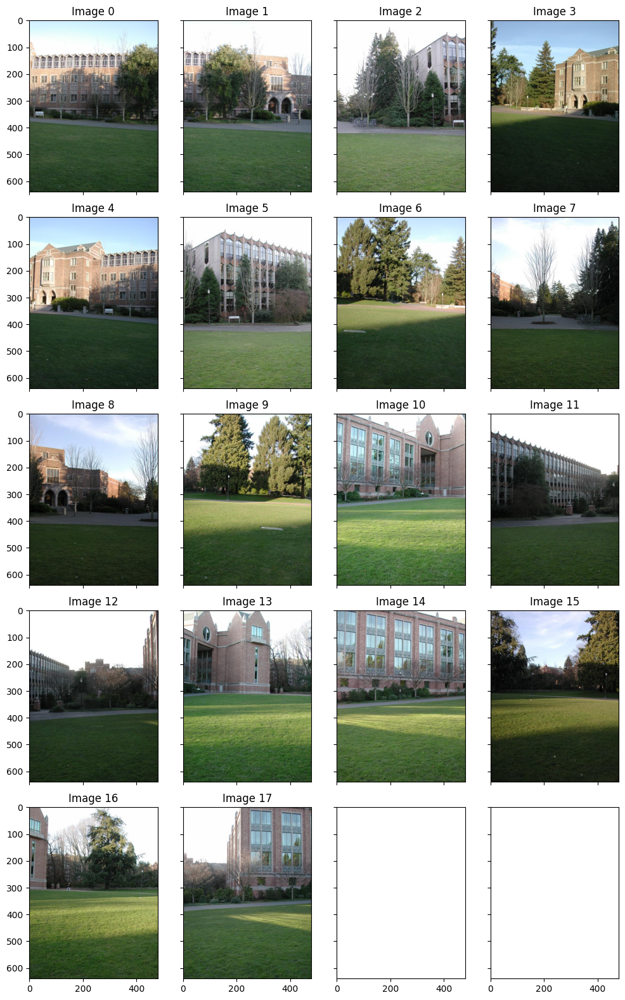

In [17]:
imgs4 = read_batch(BASE_PATH/'4')
fd4 = extract_all_features(imgs4.values())
show_batch(imgs4.values())

stitching 0
stitching 4
tx:303, ty:39, img2:(640, 480, 3), x:0, y:0, w:525, h:709
stitching 1
tx:0, ty:0, img2:(709, 783, 3), x:566, y:2, w:529, h:717
stitching 3
tx:412, ty:83, img2:(719, 1095, 3), x:0, y:0, w:676, h:859
stitching 6
tx:692, ty:175, img2:(859, 1507, 3), x:0, y:0, w:1067, h:1189
stitching 8
tx:0, ty:0, img2:(1189, 2199, 3), x:1932, y:181, w:686, h:874
stitching 9
tx:2106, ty:561, img2:(1189, 2618, 3), x:0, y:0, w:2751, h:2344
stitching 7
tx:0, ty:0, img2:(2344, 4724, 3), x:4348, y:568, w:1092, h:1219
stitching 12
tx:0, ty:0, img2:(2344, 5440, 3), x:3193, y:955, w:44, h:3
stitching 16
tx:0, ty:0, img2:(2344, 5440, 3), x:2871, y:834, w:2275, h:201


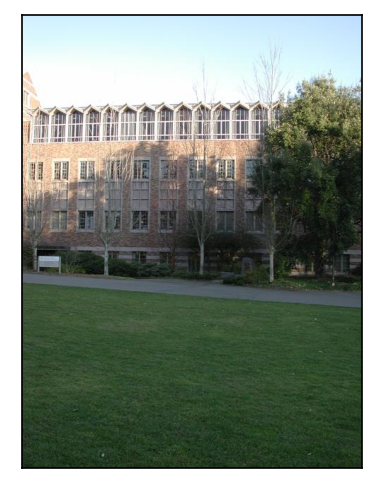

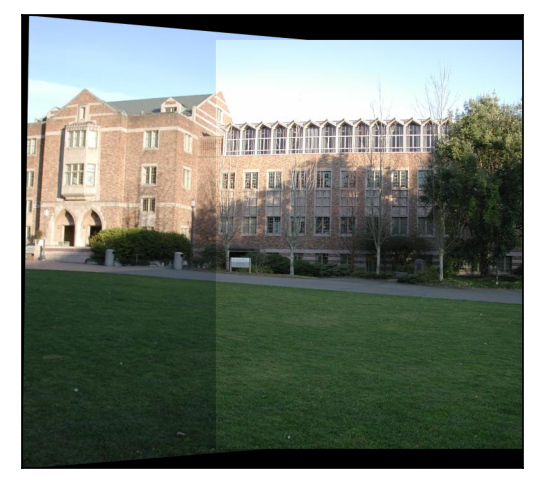

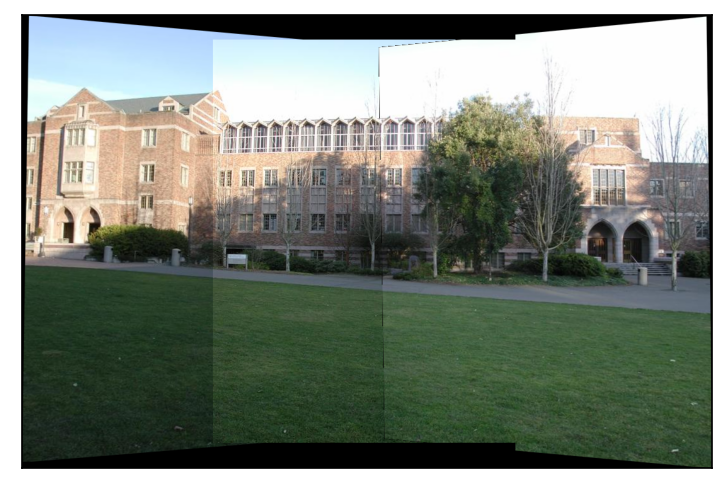

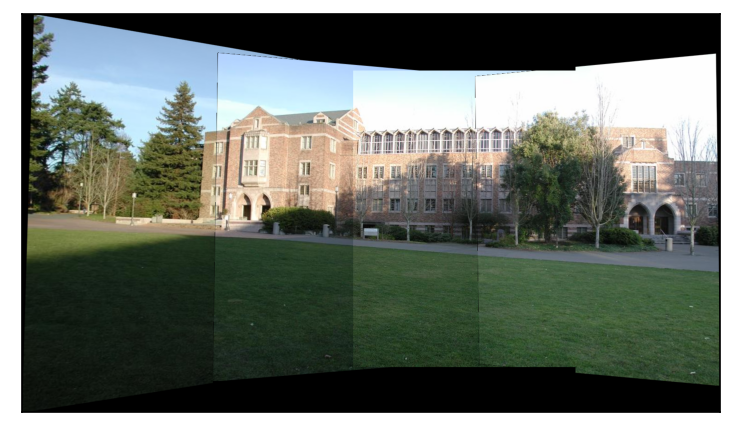

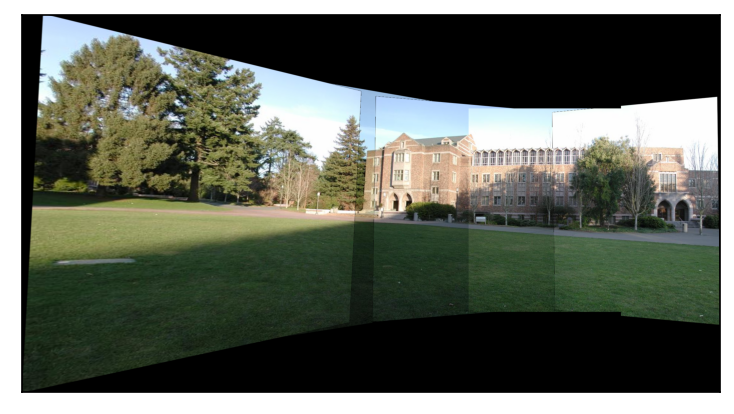

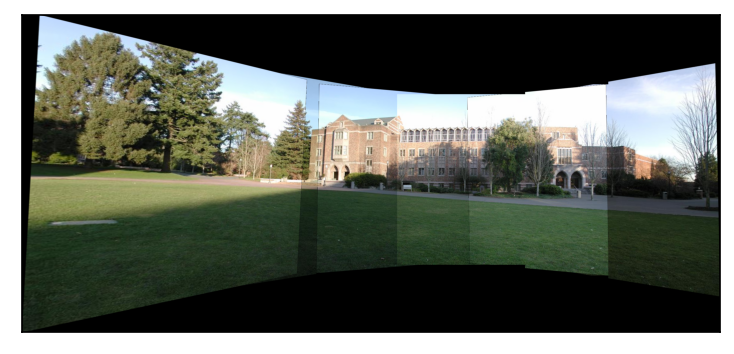

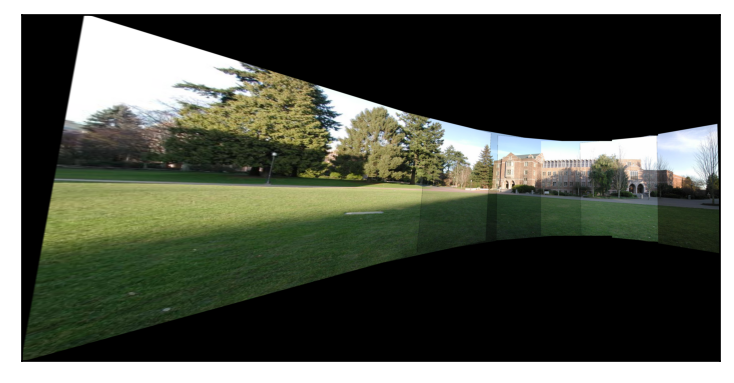

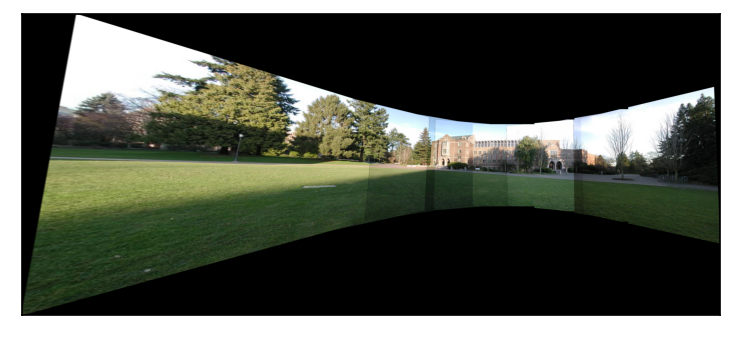

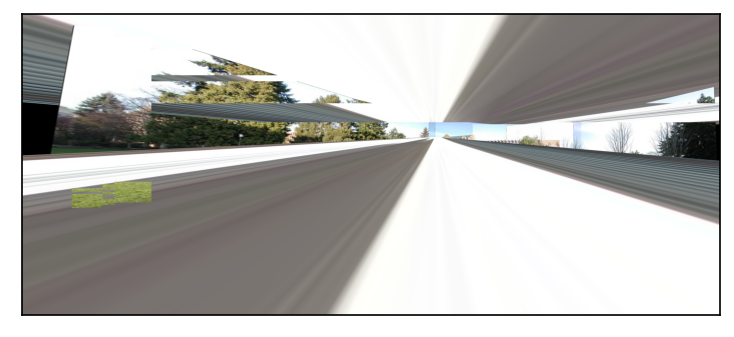

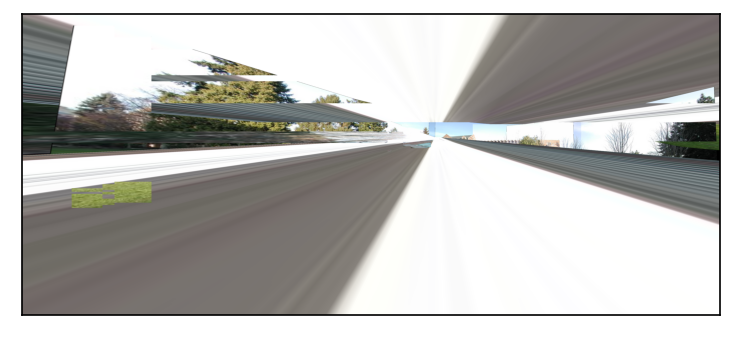

In [18]:
xx = stitch_pano(imgs4, fd4, r_thresh=0.02)
# show(xx, dpi=150)